## This code for creating mask from the neutron imaging data

In [1]:
import os, fnmatch
# import cv2
import numpy  as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
# %matplotlib inline
%matplotlib notebook
import pyfits
from os import listdir
from astropy.io import fits

E:\Anaconda3\lib\site-packages\pyfits\__init__.py:22: PyFITSDeprecationWarning: PyFITS is deprecated, please use astropy.io.fits
  PyFITSDeprecationWarning)  # noqa


In [5]:
rootpath= "/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/"
tomopath= "/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/"

In [36]:
# datapath=rootpath+a+"_bin/"
# savepath=datapath+a+"_radio/"
maskpath=rootpath+'mask/'
maskpath_tomo=tomopath+'mask/'
normpath=rootpath+'norm/'
whitebeampath= rootpath+"whitebeam/"
masked_datapath= rootpath+"masked_datapath/"
masked_tomopath= tomopath+"masked_tomo_datapath/"

In [38]:
if not os.path.exists(maskpath):
    os.makedirs(maskpath)
if not os.path.exists(normpath):
    os.makedirs(normpath)
if not os.path.exists(masked_datapath):
    os.makedirs(masked_datapath)
if not os.path.exists(masked_tomopath):
    os.makedirs(masked_tomopath)
if not os.path.exists(maskpath_tomo):
    os.makedirs(maskpath_tomo)

In [5]:
#read fits files these are the folder where the all the images are averaged to one(white beam)
myfiles1 = fnmatch.filter(listdir(whitebeampath),'*')
coll_files1 = sorted(myfiles1)
print(coll_files1)

['white_img_OB1_bin.fits', 'white_img_S1_bin.fits', 'white_img_S2_bin.fits', 'white_img_S3_bin.fits', 'white_img_S4_bin.fits', 'white_img_S5_bin.fits', 'white_img_S6_bin.fits', 'white_img_SOB2_bin.fits']


In [166]:
# getting the normalized images (image/OB)
OB_path=whitebeampath+coll_files1[0]
OB=fits.open(OB_path)
OB_data=OB[0].data
for j in range (1, (len(coll_files1)-1)): #starting from 1 and til -1 so not to take the OB
        norm_img = np.zeros([512,512],dtype='>f4')
        img_path=whitebeampath+coll_files1[j]
        img=fits.open(img_path)
        norm_img = img[0].data  
        norm_img=np.flipud(norm_img/OB_data)
        pyfits.writeto(normpath+'norm_whiteimg_'+'S'+str(j)+'.fits', norm_img,clobber=True)
        print(normpath+'norm_whiteimg_'+'S'+str(j)+'.fits')

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/norm/norm_whiteimg_S1.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/norm/norm_whiteimg_S2.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/norm/norm_whiteimg_S3.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/norm/norm_whiteimg_S4.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/norm/norm_whiteimg_S5.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/norm/norm_whiteimg_S6.fits


In [6]:
norm_coll = fnmatch.filter(listdir(normpath),'*.fits')
# norm_coll = fnmatch.filter(listdir(normpath),'Result*')
print(norm_coll)

['norm_whiteimg_S1.fits', 'norm_whiteimg_S2.fits', 'norm_whiteimg_S3.fits', 'norm_whiteimg_S4.fits', 'norm_whiteimg_S5.fits', 'norm_whiteimg_S6.fits']


<IPython.core.display.Javascript object>


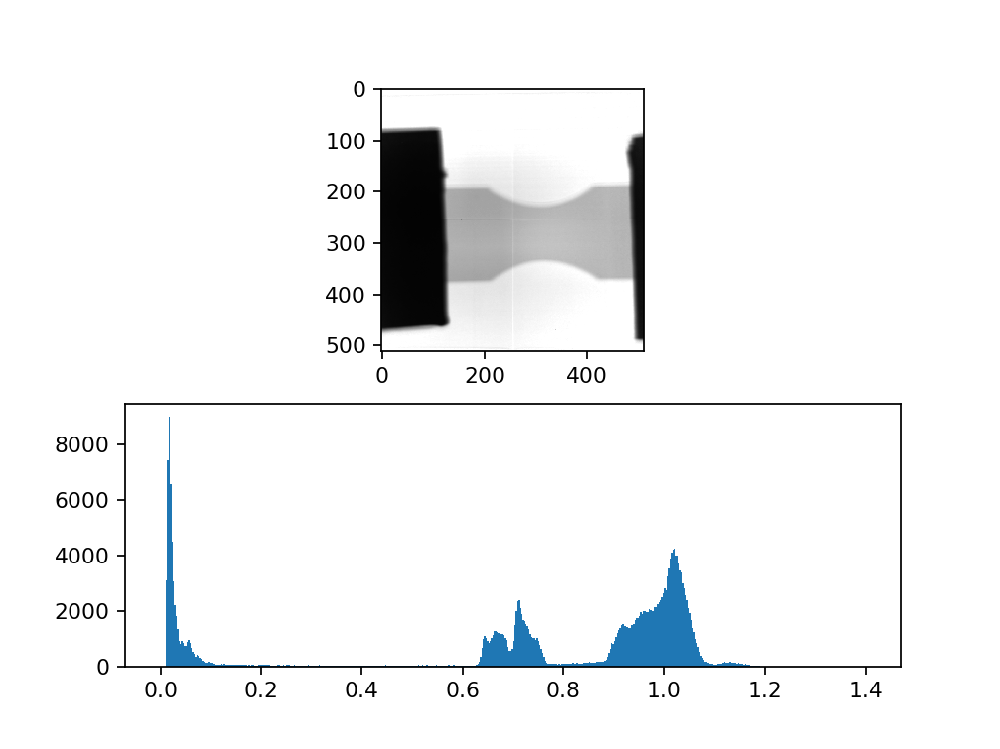

In [172]:
# plt.figure(1)
myim=fits.open(normpath+norm_coll[2])[0].data.astype(float)
fig1,ax =plt.subplots(2,1)

ax[0].imshow(myim, vmin=0, vmax=1,cmap='gray')
ax[1].hist(myim.ravel(), range=[0, 1.4], bins=512)
plt.show()


In [173]:
OA=float(input("OA="))
s=float(input("s="))

OA=0.94336506 
s=0.96744148 


<IPython.core.display.Javascript object>


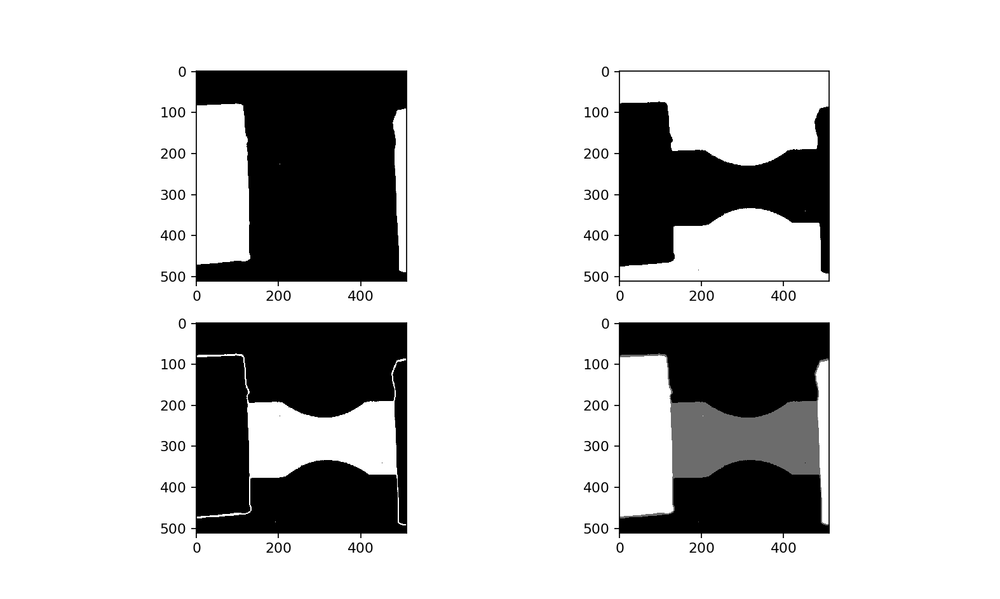

In [174]:
# plt.figure(2)
fig2,ax =plt.subplots(figsize=(10,6))
plt.subplot(2, 2, 1)
thresh_g =  myim  < 0.5
thresh_g=thresh_g.astype(float)
plt.imshow(thresh_g,cmap='gray')

plt.subplot(2, 2, 2)   
thresh_OA =  myim > 0.8
thresh_OA=thresh_OA.astype(float)
plt.imshow(thresh_OA,cmap='gray')

plt.subplot(2, 2, 3) 
sam=thresh_OA+thresh_g
thresh_s =  sam < 0.5
thresh_s=thresh_s.astype(float)
plt.imshow(thresh_s,cmap='gray')

plt.subplot(2, 2, 4) 
mask=(thresh_OA*OA)+thresh_g+(thresh_s*s)
mask=mask.astype(float)
plt.imshow(mask,cmap='gray')
plt.show()

pyfits.writeto(maskpath+'mask_img_'+'S'+str(2+1)+'.fits',(np.flipud(mask)),clobber=True)

<IPython.core.display.Javascript object>


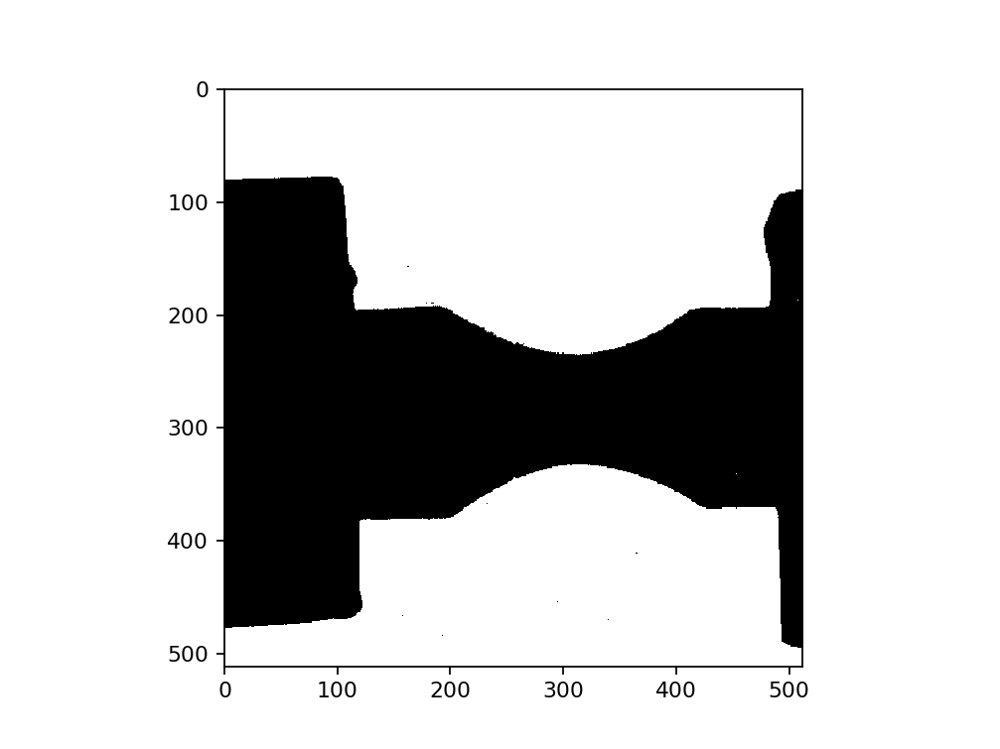

In [144]:
plt.figure(2)
thresh_OA =  myim > 0.77
thresh_OA=thresh_OA.astype(float)
plt.imshow(thresh_OA,cmap='gray')
plt.show()

<IPython.core.display.Javascript object>


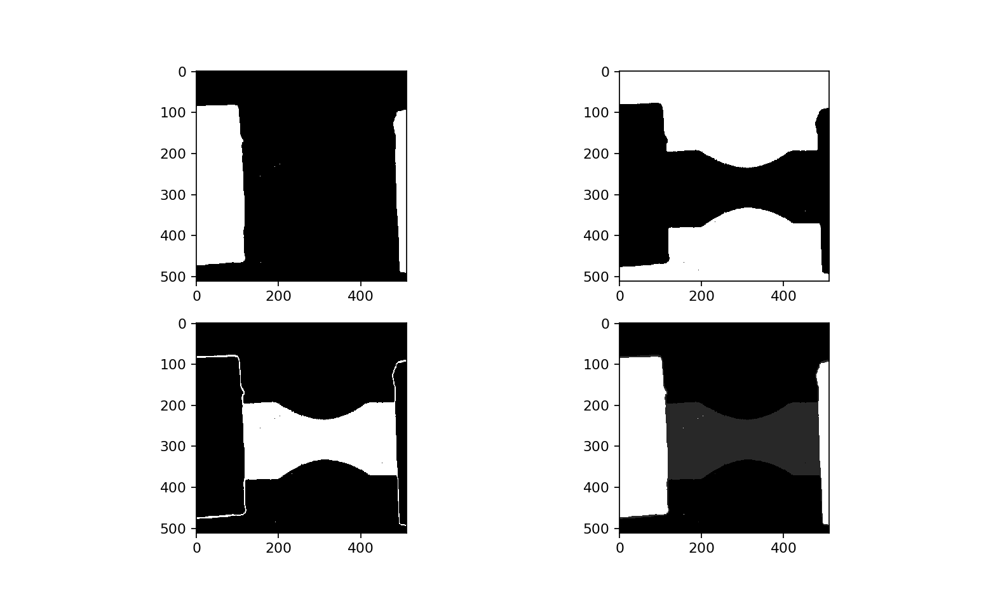

In [145]:
# plt.figure(3)
fig2,ax =plt.subplots(figsize=(10,6))
plt.subplot(2, 2, 1)
ret,thresh_g = cv2.threshold(myim,0.5,1,cv2.THRESH_BINARY_INV)
plt.imshow(thresh_g,cmap='gray')

plt.subplot(2, 2, 2) 
ret,thresh_OA = cv2.threshold(myim,0.77,1,cv2.THRESH_BINARY)
plt.imshow(thresh_OA,cmap='gray')

pyfits.writeto(maskpath+'mask_img_2'+'S'+str(5+1)+'.fits',(np.flipud(thresh_OA)),clobber=True)


plt.subplot(2, 2, 3) 
sam=thresh_OA+thresh_g
ret,thresh_s = cv2.threshold(sam,0.5,1,cv2.THRESH_BINARY_INV)
plt.imshow(thresh_s,cmap='gray')

pyfits.writeto(maskpath+'mask_img_3'+'S'+str(5+1)+'.fits',(np.flipud(thresh_s)),clobber=True)

plt.subplot(2, 2, 4) 
mask=(thresh_OA*OA)+thresh_g+(thresh_s*s)
plt.imshow(mask,cmap='gray')
plt.show()

pyfits.writeto(maskpath+'mask_img_test'+'S'+str(5+1)+'.fits',(np.flipud(mask)),clobber=True)

In [81]:
for x in range(0,512):
    for y in range(0,512):
        if (myim[x,y] < 0.5):   
            myim[x,y] = 0.0
        else:
            myim[x,y] = 1.0
thresh_g =  myim 
pyfits.writeto(normpath+"test_grip.fits", thresh_g,clobber=True)

plt.imshow(thresh_g,cmap='gray')
plt.show()

In [169]:
# mymasks = np.loadtxt('mask_values.dat')
side = []
mid = []
OA = []
grip = []
f = open('mask_values.dat')
lines = f.readlines()[1:] #read lines seperately
for line in lines:
    s = line.split()
    side.append(float(s[0]))
    mid.append(float(s[1]))
    OA.append(float(s[2]))
    grip.append(float(s[3]))
f.close()

S = np.array(side)
OA = np.array(OA)
print(S,OA)

[1.         0.98734087 0.97043825 0.96744148 0.96016465 0.90338552
 0.89796346 0.98894282] [1.         0.96589713 0.9463487  0.94336506 0.94108619 0.8799507
 0.87811282 0.85903556]


In [170]:
for i in range (0,len(norm_coll)):
    mask = np.zeros([512,512],dtype='>f4')
    myim=fits.open(normpath+norm_coll[i])[0].data.astype(float)
#     ret,thresh_g = cv2.threshold(myim,0.50,1,cv2.THRESH_BINARY_INV)
#     ret,thresh_OA = cv2.threshold(myim,0.75,1,cv2.THRESH_BINARY)
#     sam=thresh_OA+thresh_g
#     ret,thresh_s = cv2.threshold(sam,0.5,1,cv2.THRESH_BINARY_INV)
    
    thresh_g =  myim  < 0.5
    thresh_g=thresh_g.astype(float)
    
    thresh_OA =  myim > 0.77
    thresh_OA=thresh_OA.astype(float)
    sam=thresh_OA+thresh_g

    thresh_s =  sam < 0.5
    mask=(thresh_OA*OA[i+1])+thresh_g+(thresh_s*S[i+1])
    mask=mask.astype(float)
#     pyfits.writeto(maskpath+'mask_img_'+'S'+str(i+1)+'.fits',(mask),clobber=True)

    pyfits.writeto(maskpath+'mask_img_'+'S'+str(i+1)+'.fits',(np.flipud(mask)),clobber=True)
    print(maskpath+'mask_img_'+'S'+str(i+1)+'.fits')

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/mask/mask_img_S1.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/mask/mask_img_S2.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/mask/mask_img_S3.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/mask/mask_img_S4.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/mask/mask_img_S5.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/mask/mask_img_S6.fits


## multipling the mask to the Stress states

In [7]:
data_col_dir= fnmatch.filter(listdir(rootpath),'S*')
coll_dir_mask = fnmatch.filter(listdir(maskpath),'mask*')
print((data_col_dir))
print((coll_dir_mask))

['S1_bin', 'S2_bin', 'S3_bin', 'S4_bin', 'S5_bin', 'S6_bin']
['mask_img_S1.fits', 'mask_img_S2.fits', 'mask_img_S3.fits', 'mask_img_S4.fits', 'mask_img_S5.fits', 'mask_img_S6.fits']


In [8]:
for i in range (0, len(data_col_dir)): #folders for S1 (the whole tomography) images in each folder will be divided by the mask
    masked_savepath= masked_datapath+ data_col_dir[i]+"_corrected/"
    if not os.path.exists(masked_savepath):
        os.makedirs(masked_savepath)    
    
    data_dir= rootpath+data_col_dir[i]+"/"
    data_list = fnmatch.filter(listdir(data_dir),'*.fits') #to read originial fits
    if (len(data_list)== 0):  
        new_dir= fnmatch.filter(listdir(data_dir),'*')
        data_dir= rootpath+data_col_dir[i]+"/"+ new_dir[-1]+"/"
        data_list = fnmatch.filter(listdir(data_dir),'*.fits') #to read originial fits        
      
    mask_dir=maskpath+coll_dir_mask[i]
#         print(mask_dir)
    img=fits.open(mask_dir)
    mask_data = img[0].data 
#     mask_data=np.round((mask_data),7)
    for j in range (0, len(data_list)): # the length of each folder (475)
        corr_img = np.zeros([512,512], dtype='>f8')
        name= data_dir+ data_list[j]
#             print(name)
        im=fits.open(name)
        im_data=im[0].data 
#         im_data=np.round(im_data,7)
#             print((im_data[1]))
#         corr_img=np.round((im_data/mask_data),7)
#             print(corr_img1[1])
        corr_img= np.true_divide(im_data,mask_data)
#             print(corr_img[1])
        pyfits.writeto(masked_savepath+"corrected_"+data_list[j], corr_img,clobber=True)
        print(masked_savepath+"corrected_"+data_list[j])

E:\Anaconda3\lib\site-packages\pyfits\util.py:899: UserWarning: Could not find appropriate MS Visual C Runtime library or library is corrupt/misconfigured; cannot determine whether your file object was opened in append mode.  Please consider using a file object opened in write mode instead.
  'Could not find appropriate MS Visual C Runtime '


/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_02309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_02314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_02319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_02324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S1_bin_corrected/corrected_Test_013_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_052.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_053.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_055.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_056.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_057.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_058.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_123.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_125.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_126.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_127.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_128.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_188.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_190.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_191.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_192.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_193.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_260.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_261.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_262.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_263.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_265.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_337.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_338.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_340.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_341.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_342.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_343.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_407.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_408.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_410.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_411.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_412.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_avg_img_Batt_070_413.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S2_bin_corrected/corrected_S2_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_007.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_008.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_010.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_011.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_012.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_013.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_073.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_075.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_076.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_077.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_078.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_141.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_142.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_143.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_145.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_146.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_147.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_216.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_217.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_218.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_220.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_221.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_222.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_293.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_295.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_296.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_297.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_298.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_370.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_371.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_372.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_373.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_375.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_445.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_446.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_447.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_448.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_450.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_avg_img_Batt_073_451.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S3_bin_corrected/corrected_S3_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_00999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_01344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_01349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_01354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_01704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_01709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_01714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_02104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_02109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S4_bin_corrected/corrected_Batt_074_02114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_016.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_017.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_018.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_020.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_021.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_022.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_085.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_086.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_087.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_088.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_090.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_151.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_152.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_153.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_155.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_156.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_157.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_227.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_228.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_230.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_231.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_232.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_233.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_302.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_303.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_305.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_306.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_307.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_308.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_375.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_376.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_377.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_378.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_380.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_441.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_442.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_443.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_445.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_446.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_avg_img_Batt_122_447.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S5_bin_corrected/corrected_S5_av

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_01344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_01349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_01354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_01704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_01709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_01714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_01719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_01724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_01729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_02069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_02074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/masked_datapath/S6_bin_corrected/corrected_Batt_123_02104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radi

## multipling the mask to the Stress states (tomography)

In [49]:
tomo_col_dir= fnmatch.filter(listdir(tomopath),'S*')
tomo_dir_mask = fnmatch.filter(listdir(maskpath_tomo),'mask*')
print((tomo_col_dir))
print((tomo_dir_mask))

['S1_bin', 'S4_bin', 'S6_bin']
['mask_img_S1.fits', 'mask_img_S4.fits', 'mask_img_S6.fits']


In [51]:
for i in range (0, len(tomo_col_dir)): #folders for S1 (the whole tomography) images in each folder will be divided by the mask
    data_dir= tomopath+tomo_col_dir[i]+"/"
    print(data_dir)
    dir_list = fnmatch.filter(listdir(data_dir),'#*') #to read originial fits  
#     print(len(dir_list))
    mask_dir_tomo=maskpath_tomo+tomo_dir_mask[i]
    img=fits.open(mask_dir_tomo)
    mask_data = img[0].data 
    for k in range (0,len(dir_list)): 
        sub_dir=data_dir+dir_list[k]+"/"
        name_s=dir_list[k].split("#")
#         print(name_s[-1])
        data_list= fnmatch.filter(listdir(sub_dir),'*fits')
#         print(len(data_list))
        masked_tomo_savepath= masked_tomopath+ tomo_col_dir[i]+"_corrected/"+name_s[-1]+"/"
        if not os.path.exists(masked_tomo_savepath):
            os.makedirs(masked_tomo_savepath)      
        for j in range (0, len(data_list)): # the length of each folder (475)
                corr_img = np.zeros([512,512], dtype='>f8')
                name= sub_dir+ data_list[j]
                im=fits.open(name)
                im_data=im[0].data 
                corr_img= np.true_divide(im_data,mask_data)
                pyfits.writeto(masked_tomo_savepath+"corrected_"+data_list[j], corr_img)
                print(masked_tomo_savepath+"corrected_"+data_list[j])

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/S1_bin/
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/correcte

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_00784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_02069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_02074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/13_bin_python/corrected_Test_013_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_01769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_02124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_02134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/14_bin_python/corrected_Test_014_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_00789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_02204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_02209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_02214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_02219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_02224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_02229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/15_bin_python/corrected_Test_015_02234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_02309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_02314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_02319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_02324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/16_bin_python/corrected_Test_016_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_02254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/17_bin_python/corrected_Test_017_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_02294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/18_bin_python/corrected_Test_018_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_01874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_02174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_02179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/19_bin_python/corrected_Test_019_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_02244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_02249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_02254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/20_bin_python/corrected_Test_020_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_00809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_02024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_02039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_02349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/21_bin_python/corrected_Test_021_02364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_01884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_02174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_02179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/22_bin_python/corrected_Test_022_02189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_01984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/23_bin_python/corrected_Test_023_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_00829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_02024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_02039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_02324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_02349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/24_bin_python/corrected_Test_024_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_02119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_02124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_02134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/25_bin_python/corrected_Test_025_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_00999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_02209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_02214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_02219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_02224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_02229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_02234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/26_bin_python/corrected_Test_026_02239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_01999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_02004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_02009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_02294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/27_bin_python/corrected_Test_027_02309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_01804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_02104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/28_bin_python/corrected_Test_028_02109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/29_bin_python/corrected_Batt_060_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_00999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_02234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_02239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_02244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_02249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_02254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/30_bin_python/corrected_Batt_061_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_00814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_02039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_02059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_02064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_02349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/31_bin_python/corrected_Batt_062_02364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_00899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_01809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_02104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_02109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_02114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/32_bin_python/corrected_Test_032_02119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_02124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_02134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/33_bin_python/corrected_Test_033_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_00999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_01924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_02194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_02199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_02204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_02209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_02214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_02219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/34_bin_python/corrected_Test_034_02224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_00804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_01734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_02024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_02039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_02324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_02349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/35_bin_python/corrected_Test_035_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_00904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_01819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_02104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_02109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_02114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/36_bin_python/corrected_Test_036_02119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_00999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_01919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_02219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_02224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_02229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_02234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_02239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_02244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/37_bin_python/corrected_Test_037_02249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_00799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_02039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_02059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_02064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_02069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_02364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/38_bin_python/corrected_Test_038_02369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_00959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_01899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_02189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_02194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_02199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_02204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_02209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/39_bin_python/corrected_Test_039_02214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_01989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_02294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/40_bin_python/corrected_Test_040_02309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_02119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_02124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_02134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/41_bin_python/corrected_Test_041_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_00999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_02234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_02239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_02244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_02249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_02254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/42_bin_python/corrected_Test_042_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_00839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_01764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_02059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_02064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_02069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_02074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/43_bin_python/corrected_Test_043_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_00969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_01894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_02189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_02194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_02199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_02204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_02209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/44_bin_python/corrected_Test_044_02214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_01989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/45_bin_python/corrected_Test_045_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_00834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_02039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_02059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_02349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/46_bin_python/corrected_Batt_046_02364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_00904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_01804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_02104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_02109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/47_bin_python/corrected_Batt_047_02114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_00964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_01889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_02174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_02179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_02189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/48_bin_python/corrected_Batt_048_02194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_01974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/49_bin_python/corrected_Batt_049_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_00829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_01764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_02039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_02059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_02064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_02349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/50_bin_python/corrected_Batt_050_02364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/51_bin_python/corrected_Batt_051_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_02244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_02249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_02254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/52_bin_python/corrected_Batt_052_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_00854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_02104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/53_bin_python/corrected_Batt_053_02109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_00969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_01884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_02174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_02179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_02189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_02194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_02199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/54_bin_python/corrected_Batt_054_02204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_00784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_01994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_02294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/55_bin_python/corrected_Batt_055_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_00844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_02069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_02074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/56_bin_python/corrected_Batt_056_02369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_00959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_02174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_02179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/57_bin_python/corrected_Batt_057_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_01999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_02004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_02009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_02014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_02019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_02024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_02294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_02309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_02314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_02319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/58_bin_python/corrected_Batt_058_02324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_02059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_02064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_02069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_02074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S1_bin_corrected/59_bin_python/corrected_Batt_059_02369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/S4_bin/
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/co

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_00984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_02209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_02214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_02219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_02224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_02229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_02234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/100_bin_python/corrected_Batt_100_02239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_00784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_01999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_02004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_02009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_02014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_02294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_02309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/101_bin_python/corrected_Batt_101_02314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_01769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_02059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_02064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_02069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_02074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_02364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/102_bin_python/corrected_Batt_102_02369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_01889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_02179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_02189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_02194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_02199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_02204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/103_bin_python/corrected_Batt_103_02209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_01999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_02004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_02009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_02309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_02314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_02319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_02324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/104_bin_python/corrected_Batt_104_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_00894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_01824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_02109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_02114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_02119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_02124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_02134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/105_bin_python/corrected_Batt_105_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_00999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_02239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_02244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_02249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_02254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/106_bin_python/corrected_Batt_106_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_00824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_01999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_02004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_02009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_02014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_02019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_02024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_02314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_02319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_02324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/107_bin_python/corrected_Batt_107_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_00899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_01824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_02114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_02119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_02124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_02134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/108_bin_python/corrected_Batt_108_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_00999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_02249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_02254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/109_bin_python/corrected_Batt_109_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_00839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_01759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_02039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_02059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_02349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/110_bin_python/corrected_Batt_110_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/111_bin_python/corrected_Batt_111_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_01994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_02294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/112_bin_python/corrected_Batt_112_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_02064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_02069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_02074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/113_bin_python/corrected_Batt_113_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_02134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/114_bin_python/corrected_Batt_114_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_00999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_02239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_02244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_02249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_02254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/115_bin_python/corrected_Batt_115_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_00849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_01774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_02059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_02064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_02069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_02074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_02364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/116_bin_python/corrected_Batt_116_02369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_01874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_02174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/117_bin_python/corrected_Batt_117_02179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_02244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_02249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_02254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/118_bin_python/corrected_Batt_118_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_00814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_01759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_02039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_02059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_02349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/74_bin_python/corrected_Batt_074_02364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/75_bin_python/corrected_Batt_075_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_02004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_02009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_02014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_02019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_02024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_02314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_02319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_02324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/76_bin_python/corrected_Batt_076_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_01889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_02189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_02194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_02199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_02204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_02209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/77_bin_python/corrected_Batt_077_02214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_01994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_02294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/78_bin_python/corrected_Batt_078_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_02174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/79_bin_python/corrected_Batt_079_02179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_01714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_02004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_02009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_02014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_02019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_02024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_02314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_02319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_02324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/80_bin_python/corrected_Batt_080_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_01809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_02104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_02109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_02114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/81_bin_python/corrected_Batt_081_02119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_01979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/82_bin_python/corrected_Batt_082_02294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_01874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_02174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_02179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_02189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_02194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/83_bin_python/corrected_Batt_083_02199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_01719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_02024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_02039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_02364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/84_bin_python/corrected_Batt_084_02369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_00974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_01909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_02204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_02209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_02214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_02219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_02224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_02229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/85_bin_python/corrected_Batt_085_02234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_00799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_02014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_02019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_02024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_02039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_02349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/86_bin_python/corrected_Batt_086_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_02104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_02109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_02114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_02119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_02124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/87_bin_python/corrected_Batt_087_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_00964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/88_bin_python/corrected_Batt_088_02174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_02239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_02244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_02249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_02254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/89_bin_python/corrected_Batt_089_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_01814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_02119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_02124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_02134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/90_bin_python/corrected_Batt_090_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_01999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_02004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_02009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_02014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_02019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_02319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_02324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/91_bin_python/corrected_Batt_091_02349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_01824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_02104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_02109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_02114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_02119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/92_bin_python/corrected_Batt_092_02124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_00719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_02004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_02009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_02014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_02019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_02024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_02309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_02314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_02319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_02324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/93_bin_python/corrected_Batt_093_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_02174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_02179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/94_bin_python/corrected_Batt_094_02189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_00784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_01759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_02039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_02059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_02064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_02069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_02364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/95_bin_python/corrected_Batt_095_02369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_01889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_02174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_02179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/96_bin_python/corrected_Batt_096_02189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_01999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_02004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_02009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_02294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/97_bin_python/corrected_Batt_097_02309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_00894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_02119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_02124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_02134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/98_bin_python/corrected_Batt_098_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_01724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_02004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_02009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_02014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_02019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_02024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_02309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_02314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_02319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_02324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S4_bin_corrected/99_bin_python/corrected_Batt_099_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_te

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_01804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_02074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/123_bin_python/corrected_Batt_123_02104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_02124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_02134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/124_bin_python/corrected_Batt_124_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_00999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_02219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_02224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_02229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_02234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_02239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_02244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/125_bin_python/corrected_Batt_125_02249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_00784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_01999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_02004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_02009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_02014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_02019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_02294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_02309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_02314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/126_bin_python/corrected_Batt_126_02319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_02059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_02064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_02069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_02074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_02364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/127_bin_python/corrected_Batt_127_02369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_02134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/128_bin_python/corrected_Batt_128_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_00999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_01929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_02204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_02209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_02214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_02219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_02224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_02229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/129_bin_python/corrected_Batt_129_02234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_01999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_02004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_02294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/130_bin_python/corrected_Batt_130_02309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_00854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_02074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/131_bin_python/corrected_Batt_131_02104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_00969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_01884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_02174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_02179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/132_bin_python/corrected_Batt_132_02189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_00739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_02249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_02254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/133_bin_python/corrected_Batt_133_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_00829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_02019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_02024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_02039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_02349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/134_bin_python/corrected_Batt_134_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_02109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_02114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_02119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_02124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_02134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/135_bin_python/corrected_Batt_135_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_00984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_01909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_02189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_02194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_02199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_02204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_02209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/136_bin_python/corrected_Batt_136_02214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_02244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_02249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_02254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/137_bin_python/corrected_Batt_137_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_00819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_01999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_02004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_02009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_02014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_02019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_02024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_02309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_02314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_02319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_02324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/138_bin_python/corrected_Batt_138_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_01764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_02039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_02059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_02064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_02349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/139_bin_python/corrected_Batt_139_02364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_00899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_01804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_02104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/140_bin_python/corrected_Batt_140_02109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_02114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_02119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_02124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_02134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/141_bin_python/corrected_Batt_141_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_00979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_01884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_02174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_02179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/142_bin_python/corrected_Batt_142_02189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_00999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_01919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_02189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_02194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_02199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_02204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_02209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_02214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/143_bin_python/corrected_Batt_143_02219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_02234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_02239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_02244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_02249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_02254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/144_bin_python/corrected_Batt_144_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_00799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_01999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_02294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/145_bin_python/corrected_Batt_145_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_00844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_02019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_02024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_02039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_02319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_02324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/146_bin_python/corrected_Batt_146_02349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_02069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_02074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/147_bin_python/corrected_Batt_147_02369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_01834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_02104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_02109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_02114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_02119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_02124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/148_bin_python/corrected_Batt_148_02134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_00974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_01879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_02174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_02179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/149_bin_python/corrected_Batt_149_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_00999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_01924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_02194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_02199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_02204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_02209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_02214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_02219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/150_bin_python/corrected_Batt_150_02224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_02239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_02244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_02249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_02254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/151_bin_python/corrected_Batt_151_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_00799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_01999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_02294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/152_bin_python/corrected_Batt_152_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_00829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_01729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_02004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_02009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_02014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_02019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_02024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_02309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_02314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_02319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_02324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/153_bin_python/corrected_Batt_153_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_01764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_02034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_02039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_02059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_02064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_02334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_02339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_02349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/154_bin_python/corrected_Batt_154_02364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_00899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_02069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_02074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/155_bin_python/corrected_Batt_155_02369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_02104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_02109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_02114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_02119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_02124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/156_bin_python/corrected_Batt_156_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_00959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_02134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/157_bin_python/corrected_Batt_157_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_00989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01569.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01574.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01869.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01874.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_01889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_02164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_02169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_02174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_02179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_02184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/158_bin_python/corrected_Batt_158_02189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_00999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_01924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_02194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_02199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_02204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_02209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_02214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_02219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/159_bin_python/corrected_Batt_159_02224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00434.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00734.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01654.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01659.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_01959.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_02229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_02234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_02239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_02244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_02249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_02254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/160_bin_python/corrected_Batt_160_02259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_00789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_01994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_02264.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/161_bin_python/corrected_Batt_161_02294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00519.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00819.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00824.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_00829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01119.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01124.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01399.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01404.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01409.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01414.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01419.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01424.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01429.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01709.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01714.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01719.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01724.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01729.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_01999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_02004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_02009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_02014.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_02019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_02024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_02029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_02304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_02309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_02314.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_02319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_02324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/162_bin_python/corrected_Batt_162_02329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00259.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00564.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01439.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01739.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_01769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_02044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_02049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_02054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_02059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_02064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_02069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_02074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_02344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_02349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_02354.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_02364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/163_bin_python/corrected_Batt_163_02369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00579.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00879.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00884.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_00909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01184.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01189.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01194.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01484.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01489.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01494.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01499.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01504.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01509.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01514.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01784.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01789.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01794.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01799.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01804.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01809.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_01814.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_02094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_02099.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_02104.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_02109.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/164_bin_python/corrected_Batt_164_02114.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00019.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00024.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00029.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00034.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00039.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00044.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00319.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00324.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00329.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00334.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00339.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00344.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00349.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00619.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00624.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00629.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00634.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00639.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00644.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00649.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00924.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00929.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00934.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00939.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00944.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00949.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_00954.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01249.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01254.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01559.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01829.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_01859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_02129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_02134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_02139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_02144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_02149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_02154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/165_bin_python/corrected_Batt_165_02159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00094.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00394.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00699.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00704.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_00999.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01004.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01009.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01304.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01309.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01584.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01589.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01594.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01599.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01604.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01609.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01614.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01889.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01894.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01899.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01904.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01909.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01914.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_01919.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_02199.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_02204.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_02209.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_02214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_02219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_02224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/166_bin_python/corrected_Batt_166_02229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00129.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00134.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00139.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00144.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00444.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00744.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_00774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01049.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01054.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01369.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01374.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01379.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01384.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01389.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01664.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01669.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01674.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01679.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01684.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01689.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01694.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01964.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01969.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01974.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01979.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01984.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01989.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_01994.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_02269.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_02274.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_02279.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_02284.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_02289.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_02294.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/167_bin_python/corrected_Batt_167_02299.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00214.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00219.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00224.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00229.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00234.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00239.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00244.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00524.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00529.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00534.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00539.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00544.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00549.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00554.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00834.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00839.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00844.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00849.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00854.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00859.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_00864.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01149.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01154.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01159.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01164.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01169.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01174.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01179.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01449.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01454.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01459.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01464.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01469.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01474.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01479.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01749.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01754.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01759.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01764.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01769.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01774.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_01779.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_02059.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_02064.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_02069.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_02074.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_02079.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_02084.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_02089.fits
/Oct-Japan/563_SENJU_Oct2018_Robin

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_02359.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_02364.fits
/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/masked_tomo_datapath/S6_bin_corrected/168_bin_python/corrected_Batt_168_02369.fits
